<a href="https://colab.research.google.com/github/ettatanuja-cmyk/Neuro-exercise/blob/main/small_eeg_dataset_preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# ============================================================
# CELL 1: INSTALL REQUIRED LIBRARIES
# ============================================================

# MNE is the main Python library we use for EEG processing.
# It helps us read EDF files, filter EEG, create epochs, etc.
!pip install -q mne

# These libraries are used for:
# scipy  -> statistical operations and outlier detection
# pandas -> displaying data in table format
# matplotlib -> plotting EEG signals
# scikit-learn -> preprocessing utilities
!pip install -q scipy pandas matplotlib scikit-learn

print("All required libraries installed successfully.")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 32.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython 7.34.0 requires jedi>=0.16, which is not installed.
moviepy 1.0.3 requires decorator<5.0,>=4.0.2, but you have decorator 5.3.1 which is incompatible.
All required libraries installed successfully.


In [ ]:
# ============================================================
# CELL 2: IMPORT LIBRARIES
# ============================================================

# Import MNE for EEG/EDF processing
import mne

# NumPy is used for numerical calculations
import numpy as np

# Pandas is used to create tables
import pandas as pd

# Matplotlib is used to draw EEG graphs
import matplotlib.pyplot as plt

# SciPy provides statistical functions
# We will use it later for outlier detection
from scipy import stats

# StandardScaler is a commonly used scaling tool
from sklearn.preprocessing import StandardScaler

# Ignore unnecessary warning messages
import warnings
warnings.filterwarnings("ignore")


print("Libraries imported successfully.")


# ============================================================
# EEG BEFORE/AFTER PLOT FUNCTION
# ============================================================

def plot_eeg_before_after(
    before_raw,
    after_raw,
    title_before,
    title_after,
    duration=10,
    n_channels=16
):
    """
    This function plots EEG before and after a processing step.

    BEFORE:
        EEG before applying an operation.

    AFTER:
        EEG after applying that operation.

    This makes it easy to visually compare the signal.
    """

    # Use only the number of channels that actually exist.
    n_ch = min(
        n_channels,
        len(before_raw.ch_names),
        len(after_raw.ch_names)
    )

    # --------------------------------------------------------
    # BEFORE EEG
    # --------------------------------------------------------

    # Calculate how many samples are needed
    # for the selected time duration.
    before_samples = min(
        before_raw.n_times,
        int(duration * before_raw.info["sfreq"])
    )

    # Get EEG data for the selected channels.
    before_data = before_raw.get_data(
        picks=range(n_ch),
        start=0,
        stop=before_samples
    )

    # Convert EEG from Volts to microvolts.
    before_data = before_data * 1e6

    # Create time values for the x-axis.
    before_times = np.arange(
        before_data.shape[1]
    ) / before_raw.info["sfreq"]

    # Create the EEG figure.
    plt.figure(figsize=(15, 7))

    # Find a suitable vertical distance between channels.
    offset = max(
        np.std(before_data, axis=1).mean() * 5,
        1
    )

    # Plot each EEG channel.
    for ch in range(n_ch):

        plt.plot(
            before_times,
            before_data[ch] + ch * offset
        )

    plt.title(title_before)
    plt.xlabel("Time (seconds)")
    plt.ylabel("EEG amplitude (µV)")

    # Show channel names on y-axis.
    plt.yticks(
        np.arange(n_ch) * offset,
        before_raw.ch_names[:n_ch]
    )

    plt.grid(True, alpha=0.3)
    plt.show()


    # --------------------------------------------------------
    # AFTER EEG
    # --------------------------------------------------------

    # Calculate samples needed for AFTER signal.
    after_samples = min(
        after_raw.n_times,
        int(duration * after_raw.info["sfreq"])
    )

    # Get AFTER EEG data.
    after_data = after_raw.get_data(
        picks=range(n_ch),
        start=0,
        stop=after_samples
    )

    # Convert Volts to microvolts.
    after_data = after_data * 1e6

    # Create AFTER time values.
    after_times = np.arange(
        after_data.shape[1]
    ) / after_raw.info["sfreq"]

    # Create AFTER EEG figure.
    plt.figure(figsize=(15, 7))

    # Calculate vertical channel spacing.
    offset_after = max(
        np.std(after_data, axis=1).mean() * 5,
        1
    )

    # Plot every EEG channel.
    for ch in range(n_ch):

        plt.plot(
            after_times,
            after_data[ch] + ch * offset_after
        )

    plt.title(title_after)
    plt.xlabel("Time (seconds)")
    plt.ylabel("EEG amplitude (µV)")

    plt.yticks(
        np.arange(n_ch) * offset_after,
        after_raw.ch_names[:n_ch]
    )

    plt.grid(True, alpha=0.3)
    plt.show()


print("EEG BEFORE/AFTER plotting function created.")

Libraries imported successfully.
EEG BEFORE/AFTER plotting function created.


Saving S001R10.edf to S001R10.edf
EEG file selected: S001R10.edf

========== BEFORE ==========
EEG signal is not loaded yet.

========== AFTER ==========
EEG loaded successfully.
Number of channels: 64
Sampling frequency: 160.0 Hz
Number of samples: 20000
Duration: 124.99 seconds
Using matplotlib as 2D backend.
For automatic theme detection, "darkdetect" has to be installed! You can install it with `pip install darkdetect`


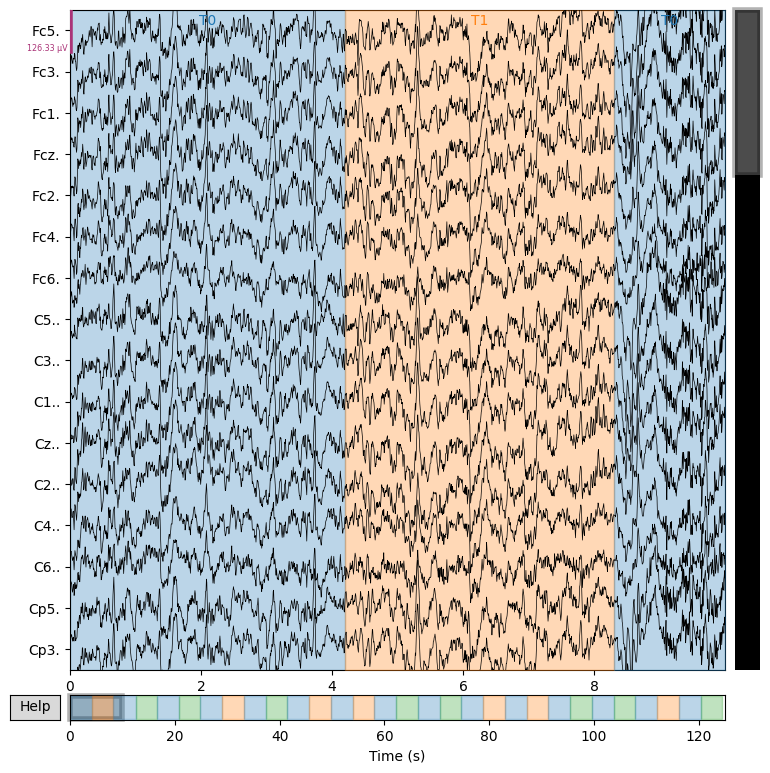

In [ ]:
# ============================================================
# CELL 3: UPLOAD AND LOAD EEG DATASET
# ============================================================

# This allows us to upload our EEG EDF file into Google Colab.
from google.colab import files

# Upload the file.
uploaded = files.upload()

# Find files ending with .edf.
edf_files = [
    filename
    for filename in uploaded.keys()
    if filename.lower().endswith(".edf")
]

# Check whether an EDF file was uploaded.
if len(edf_files) == 0:
    raise FileNotFoundError(
        "No EDF file found. Please upload an EEG .edf file."
    )

# Select the first EDF file.
edf_path = edf_files[0]

print("EEG file selected:", edf_path)


# ------------------------------------------------------------
# BEFORE
# ------------------------------------------------------------

# At this point, EEG has not been loaded yet.
print("\n========== BEFORE ==========")
print("EEG signal is not loaded yet.")


# ------------------------------------------------------------
# LOAD EEG
# ------------------------------------------------------------

# read_raw_edf() reads the EDF EEG file.
# preload=True loads the signal into memory so
# we can process it later.
raw = mne.io.read_raw_edf(
    edf_path,
    preload=True,
    verbose=False
)


# ------------------------------------------------------------
# AFTER
# ------------------------------------------------------------

print("\n========== AFTER ==========")

print("EEG loaded successfully.")

# Number of EEG channels
print("Number of channels:", len(raw.ch_names))

# Original sampling frequency
print(
    "Sampling frequency:",
    raw.info["sfreq"],
    "Hz"
)

# Number of samples
print(
    "Number of samples:",
    raw.n_times
)

# Total recording duration
print(
    "Duration:",
    round(raw.times[-1], 2),
    "seconds"
)


# Display EEG after loading.
raw.plot(
    duration=min(10, raw.times[-1]),
    n_channels=min(16, len(raw.ch_names)),
    scalings="auto",
    title="AFTER LOADING: Raw EEG",
    show=True
)

plt.show()

========== BEFORE ==========
Current EEG is the raw EEG signal.

========== EEG INFORMATION ==========
<Info | 8 non-empty values
 bads: []
 ch_names: Fc5., Fc3., Fc1., Fcz., Fc2., Fc4., Fc6., C5.., C3.., C1.., ...
 chs: 64 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 80.0 Hz
 meas_date: 2009-08-12 16:15:00 UTC
 nchan: 64
 projs: []
 sfreq: 160.0 Hz
 subject_info: <subject_info | his_id: X, sex: 0, last_name: X>
>

========== AFTER ==========
Dataset inspection completed.
No changes were made to the EEG signal.


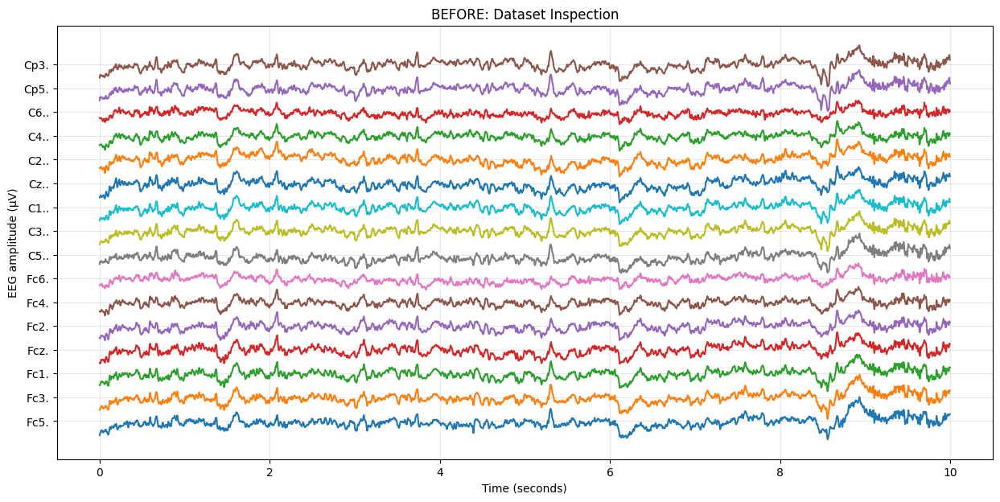

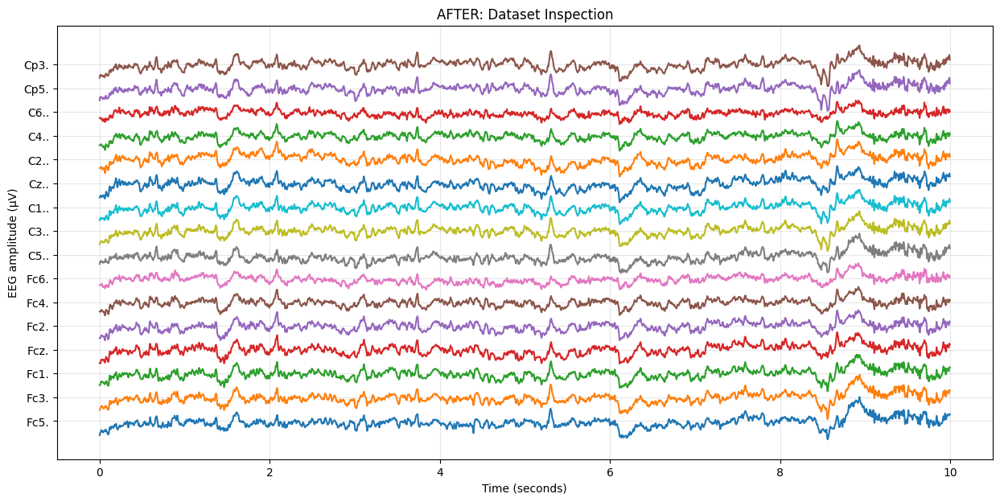

In [ ]:
# ============================================================
# CELL 4: DATASET INSPECTION
# ============================================================

# Make a copy of the current EEG.
# This represents our BEFORE signal.
before = raw.copy()

print("========== BEFORE ==========")
print("Current EEG is the raw EEG signal.")


# ------------------------------------------------------------
# INSPECT EEG INFORMATION
# ------------------------------------------------------------

# raw.info contains important information about the EEG.
print("\n========== EEG INFORMATION ==========")

print(raw.info)


# ------------------------------------------------------------
# AFTER
# ------------------------------------------------------------

# Dataset inspection does NOT change the EEG.
# Therefore AFTER is just another copy of the same EEG.
after = raw.copy()

print("\n========== AFTER ==========")
print("Dataset inspection completed.")
print("No changes were made to the EEG signal.")


# ------------------------------------------------------------
# BEFORE / AFTER EEG
# ------------------------------------------------------------

plot_eeg_before_after(
    before,
    after,
    "BEFORE: Dataset Inspection",
    "AFTER: Dataset Inspection"
)

========== BEFORE ==========
Raw EEG is unchanged.

========== AFTER ==========
Number of channels : 64
Sampling frequency: 160.0 Hz
Number of samples : 20000
Duration          : 124.99 seconds

Channel Names:
1 : Fc5.
2 : Fc3.
3 : Fc1.
4 : Fcz.
5 : Fc2.
6 : Fc4.
7 : Fc6.
8 : C5..
9 : C3..
10 : C1..
11 : Cz..
12 : C2..
13 : C4..
14 : C6..
15 : Cp5.
16 : Cp3.
17 : Cp1.
18 : Cpz.
19 : Cp2.
20 : Cp4.
21 : Cp6.
22 : Fp1.
23 : Fpz.
24 : Fp2.
25 : Af7.
26 : Af3.
27 : Afz.
28 : Af4.
29 : Af8.
30 : F7..
31 : F5..
32 : F3..
33 : F1..
34 : Fz..
35 : F2..
36 : F4..
37 : F6..
38 : F8..
39 : Ft7.
40 : Ft8.
41 : T7..
42 : T8..
43 : T9..
44 : T10.
45 : Tp7.
46 : Tp8.
47 : P7..
48 : P5..
49 : P3..
50 : P1..
51 : Pz..
52 : P2..
53 : P4..
54 : P6..
55 : P8..
56 : Po7.
57 : Po3.
58 : Poz.
59 : Po4.
60 : Po8.
61 : O1..
62 : Oz..
63 : O2..
64 : Iz..


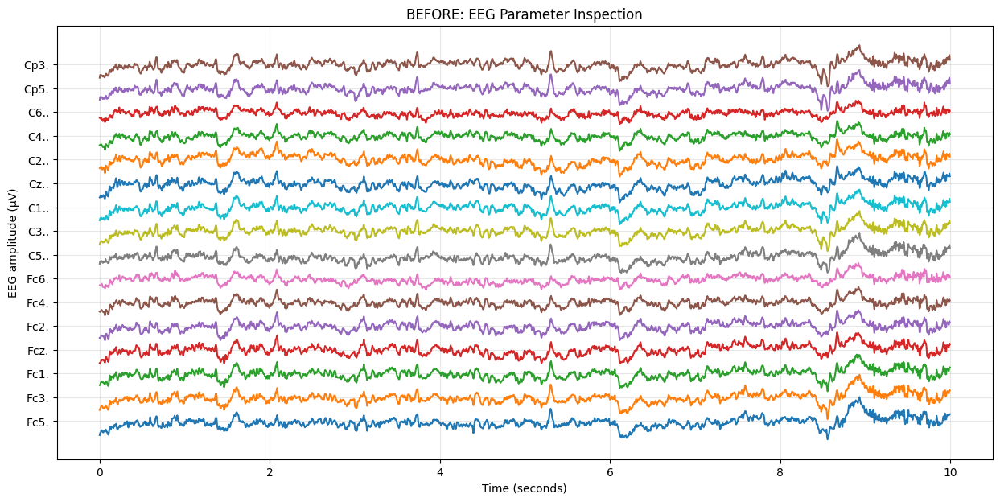

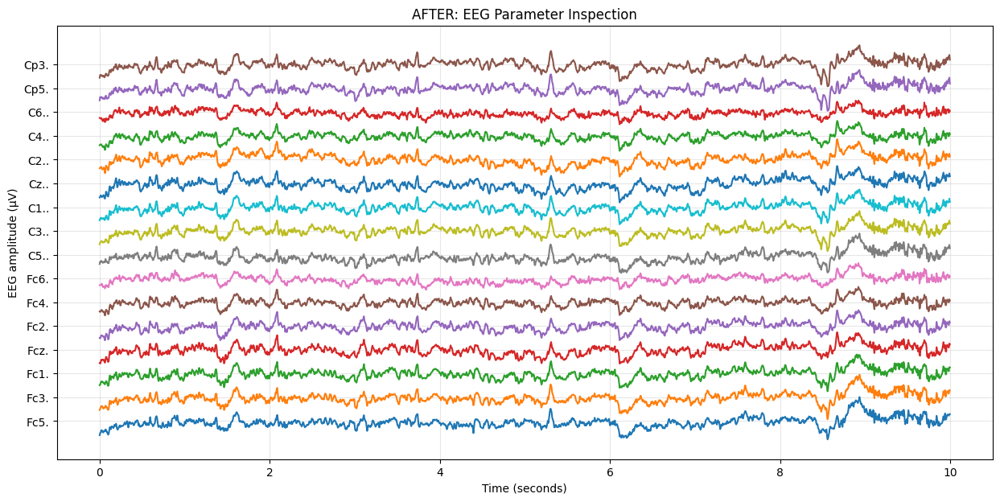

In [ ]:
# ============================================================
# CELL 5: CHANNELS, SAMPLING RATE AND DURATION
# ============================================================

before = raw.copy()

print("========== BEFORE ==========")
print("Raw EEG is unchanged.")


# ------------------------------------------------------------
# GET BASIC EEG INFORMATION
# ------------------------------------------------------------

# Count the EEG channels.
n_channels = len(raw.ch_names)

# Get sampling frequency.
sampling_frequency = raw.info["sfreq"]

# Count total samples.
n_samples = raw.n_times

# Calculate recording duration.
duration = raw.times[-1]


# ------------------------------------------------------------
# AFTER
# ------------------------------------------------------------

print("\n========== AFTER ==========")

print("Number of channels :", n_channels)
print("Sampling frequency:", sampling_frequency, "Hz")
print("Number of samples :", n_samples)
print("Duration          :", round(duration, 2), "seconds")


# Print all channel names.
print("\nChannel Names:")

for i, name in enumerate(raw.ch_names, 1):

    print(i, ":", name)


# EEG itself was not changed.
after = raw.copy()


# ------------------------------------------------------------
# BEFORE / AFTER
# ------------------------------------------------------------

plot_eeg_before_after(
    before,
    after,
    "BEFORE: EEG Parameter Inspection",
    "AFTER: EEG Parameter Inspection"
)

========== BEFORE ==========
EEG data shape:
(64, 20000)

========== AFTER ==========
Statistics calculated successfully.


,Channel,Mean (µV),Std (µV),Minimum (µV),Maximum (µV)
0,Fc5.,-3.27615,57.784553,-281.0,313.0
1,Fc3.,0.29585,56.233972,-265.0,297.0
2,Fc1.,0.89550,56.611734,-279.0,254.0
3,Fcz.,1.42395,58.219968,-262.0,250.0
4,Fc2.,0.30170,54.853515,-250.0,226.0
...,...,...,...,...,...
59,Po8.,0.02825,47.040727,-249.0,223.0
60,O1..,-1.76705,50.257894,-268.0,241.0
61,Oz..,-1.74935,49.479435,-267.0,239.0
62,O2..,-2.04365,62.496652,-261.0,252.0


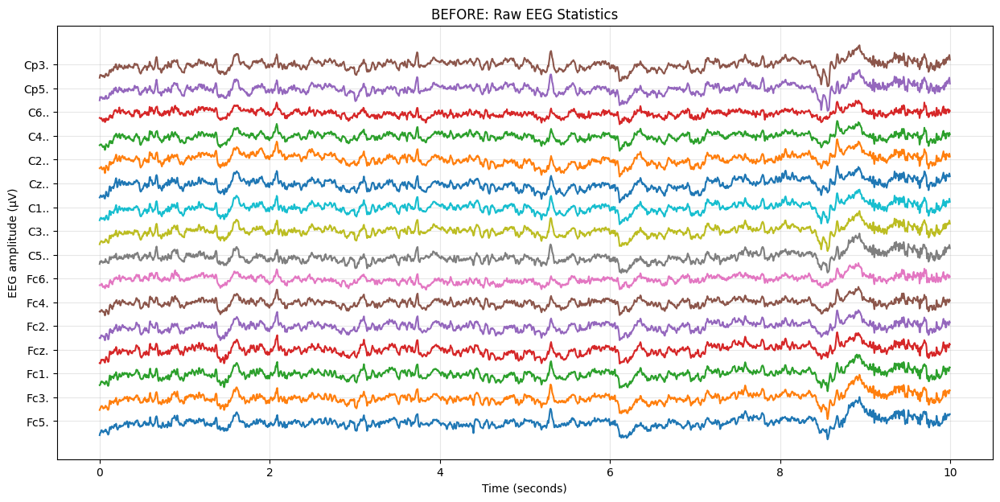

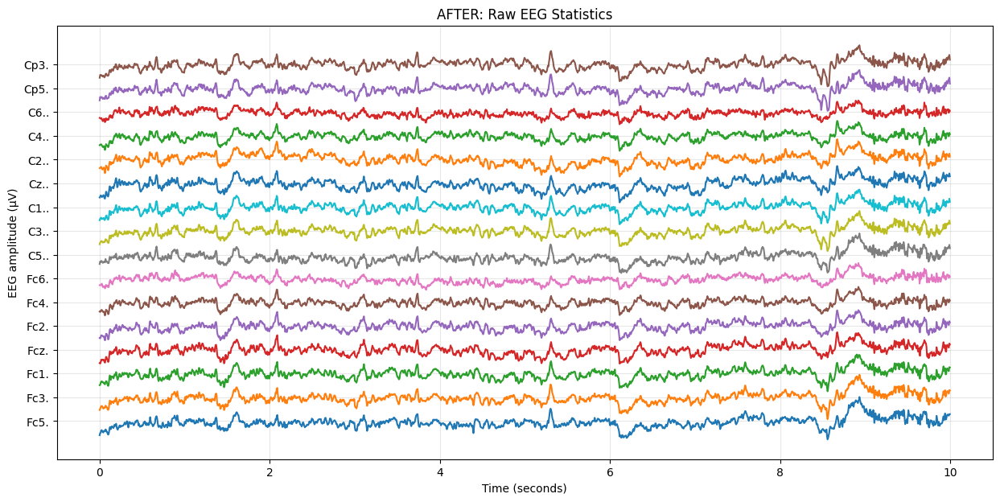

In [ ]:
# ============================================================
# CELL 6: EEG SHAPE AND BASIC STATISTICS
# ============================================================

before = raw.copy()

# Get numerical EEG data.
# Shape will normally be:
# (number of channels, number of samples)
eeg_data = raw.get_data()

print("========== BEFORE ==========")

print("EEG data shape:")
print(eeg_data.shape)


# ------------------------------------------------------------
# CONVERT TO MICROVOLTS
# ------------------------------------------------------------

# EEG values from MNE are normally in Volts.
# Multiplying by 1,000,000 converts them to microvolts.
eeg_uv = eeg_data * 1e6


# ------------------------------------------------------------
# CALCULATE STATISTICS
# ------------------------------------------------------------

statistics_table = pd.DataFrame({

    "Channel": raw.ch_names,

    # Average EEG value
    "Mean (µV)": np.mean(
        eeg_uv,
        axis=1
    ),

    # Standard deviation tells us
    # how much the signal varies.
    "Std (µV)": np.std(
        eeg_uv,
        axis=1
    ),

    # Smallest value
    "Minimum (µV)": np.min(
        eeg_uv,
        axis=1
    ),

    # Largest value
    "Maximum (µV)": np.max(
        eeg_uv,
        axis=1
    )
})


# ------------------------------------------------------------
# AFTER
# ------------------------------------------------------------

print("\n========== AFTER ==========")

print("Statistics calculated successfully.")

display(statistics_table)

# No EEG processing happened here.
after = raw.copy()


# ------------------------------------------------------------
# BEFORE / AFTER EEG
# ------------------------------------------------------------

plot_eeg_before_after(
    before,
    after,
    "BEFORE: Raw EEG Statistics",
    "AFTER: Raw EEG Statistics"
)

========== BEFORE ==========
This is the original raw EEG before preprocessing.
For automatic theme detection, "darkdetect" has to be installed! You can install it with `pip install darkdetect`


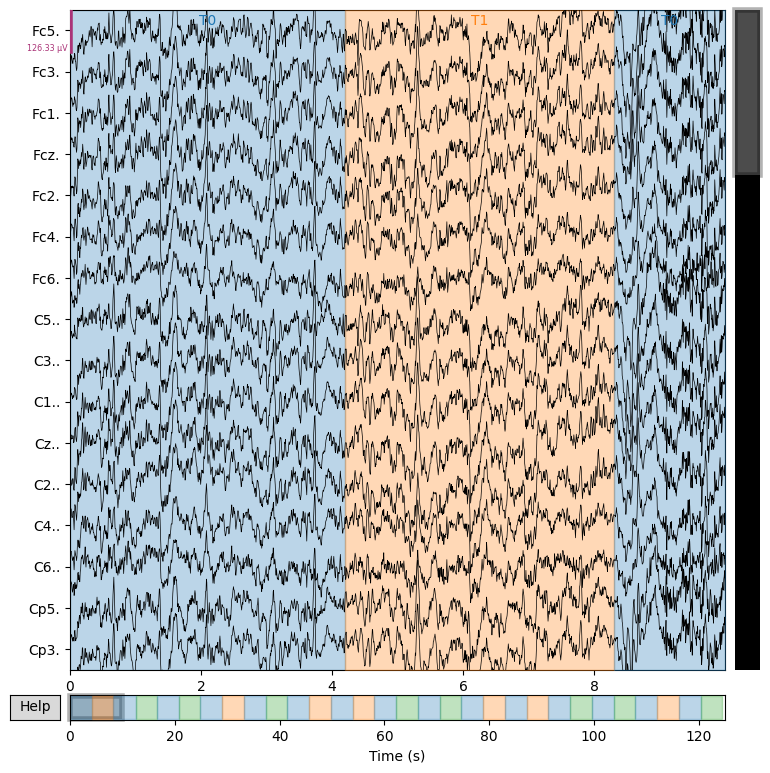


========== AFTER ==========
Raw EEG was only visualized.
No processing was performed.
For automatic theme detection, "darkdetect" has to be installed! You can install it with `pip install darkdetect`


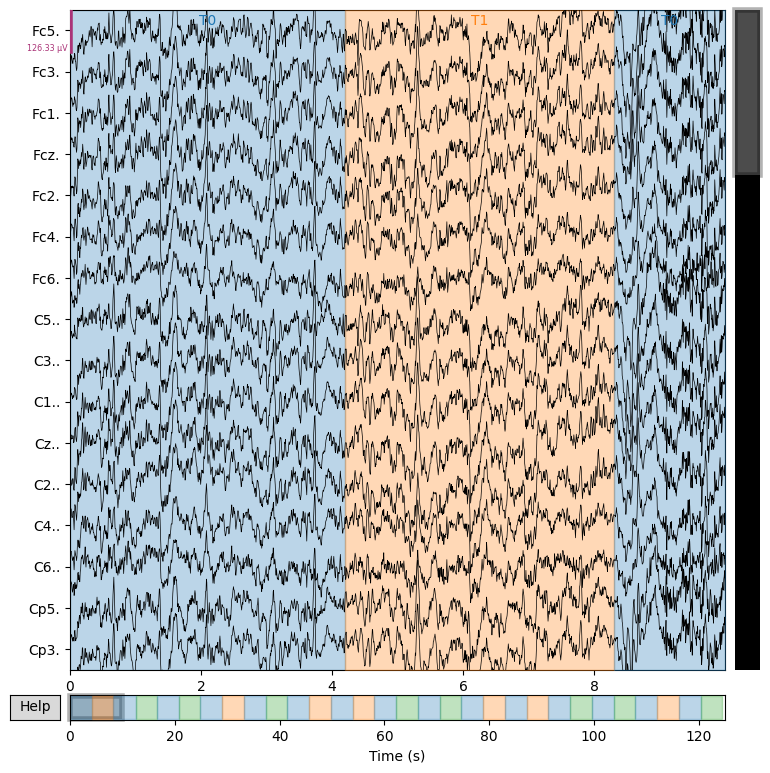

In [ ]:
# ============================================================
# CELL 7: RAW EEG VISUALIZATION
# ============================================================

before = raw.copy()

print("========== BEFORE ==========")
print("This is the original raw EEG before preprocessing.")


# ------------------------------------------------------------
# PLOT RAW EEG
# ------------------------------------------------------------

before.plot(
    duration=min(
        10,
        before.times[-1]
    ),
    n_channels=min(
        16,
        len(before.ch_names)
    ),
    scalings="auto",
    title="BEFORE: Raw EEG Signal",
    show=True
)

plt.show()


# ------------------------------------------------------------
# AFTER
# ------------------------------------------------------------

# Visualization does not modify the signal.
after = raw.copy()

print("\n========== AFTER ==========")
print("Raw EEG was only visualized.")
print("No processing was performed.")


after.plot(
    duration=min(
        10,
        after.times[-1]
    ),
    n_channels=min(
        16,
        len(after.ch_names)
    ),
    scalings="auto",
    title="AFTER: Raw EEG Signal",
    show=True
)

plt.show()

========== BEFORE ==========
Raw EEG before checking events.
Number of annotations: 30

Annotations:
<Annotations | 30 segments: T0 (15), T1 (7), T2 (8)>

Event shape:
(30, 3)

Event IDs:
{'T0': 1, 'T1': 2, 'T2': 3}

========== AFTER ==========
Event inspection completed.
EEG signal itself was not changed.


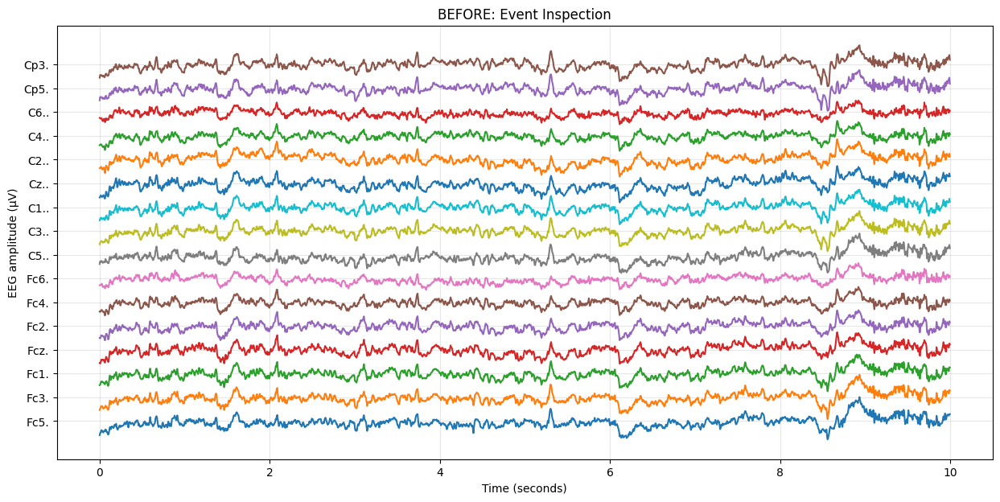

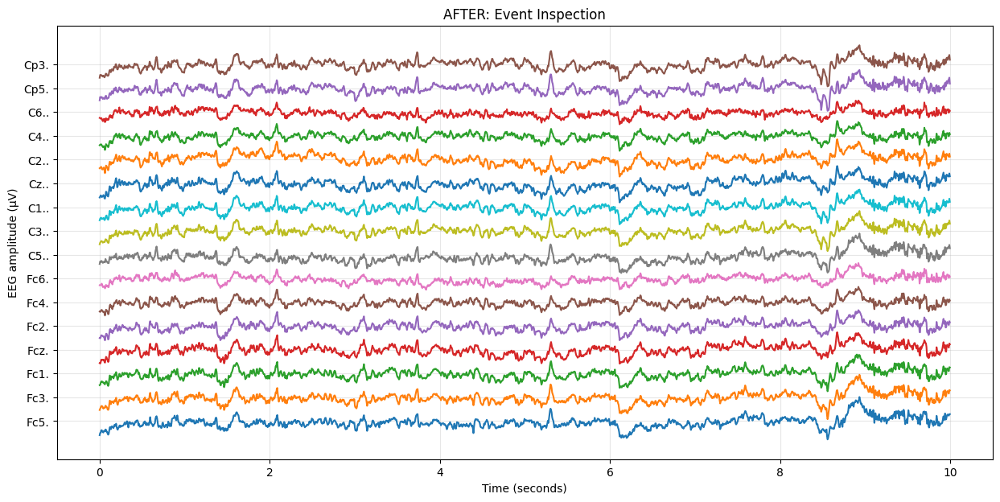

In [ ]:
# ============================================================
# CELL 8: CHECK EEG ANNOTATIONS AND EVENTS
# ============================================================

before = raw.copy()

print("========== BEFORE ==========")
print("Raw EEG before checking events.")


# ------------------------------------------------------------
# CHECK ANNOTATIONS
# ------------------------------------------------------------

# Annotations contain information about events
# recorded during the EEG experiment.
print(
    "Number of annotations:",
    len(raw.annotations)
)


if len(raw.annotations) > 0:

    # Display annotations.
    print("\nAnnotations:")
    print(raw.annotations)

    # Convert annotations into event numbers.
    events, event_id = mne.events_from_annotations(
        raw,
        verbose=False
    )

    print("\nEvent shape:")
    print(events.shape)

    print("\nEvent IDs:")
    print(event_id)

else:

    print("\nNo annotations/events found.")


# ------------------------------------------------------------
# AFTER
# ------------------------------------------------------------

# Event inspection does not modify the EEG.
after = raw.copy()

print("\n========== AFTER ==========")
print("Event inspection completed.")
print("EEG signal itself was not changed.")


# BEFORE / AFTER
plot_eeg_before_after(
    before,
    after,
    "BEFORE: Event Inspection",
    "AFTER: Event Inspection"
)

========== BEFORE DOWNSAMPLING ==========
Original sampling frequency: 160.0 Hz
Original number of samples: 20000

========== AFTER DOWNSAMPLING ==========
New sampling frequency: 120.0 Hz
New number of samples: 15000


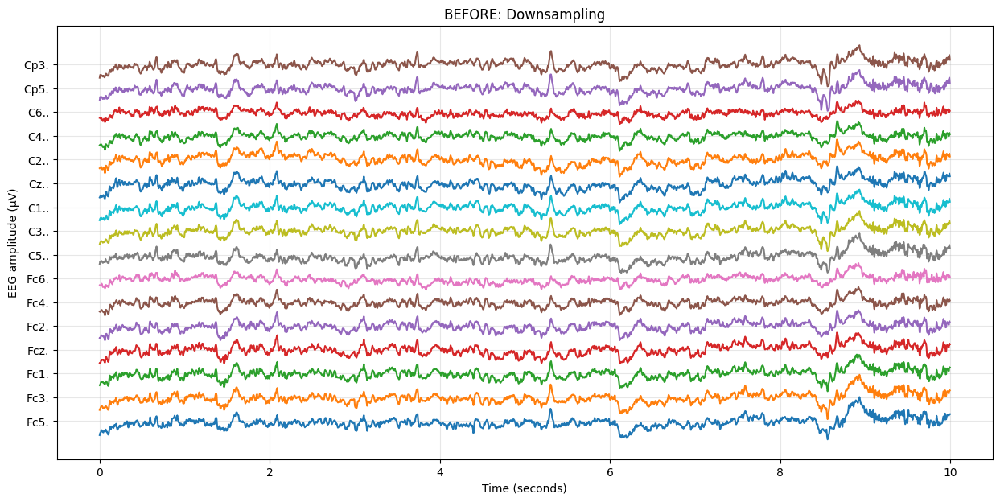

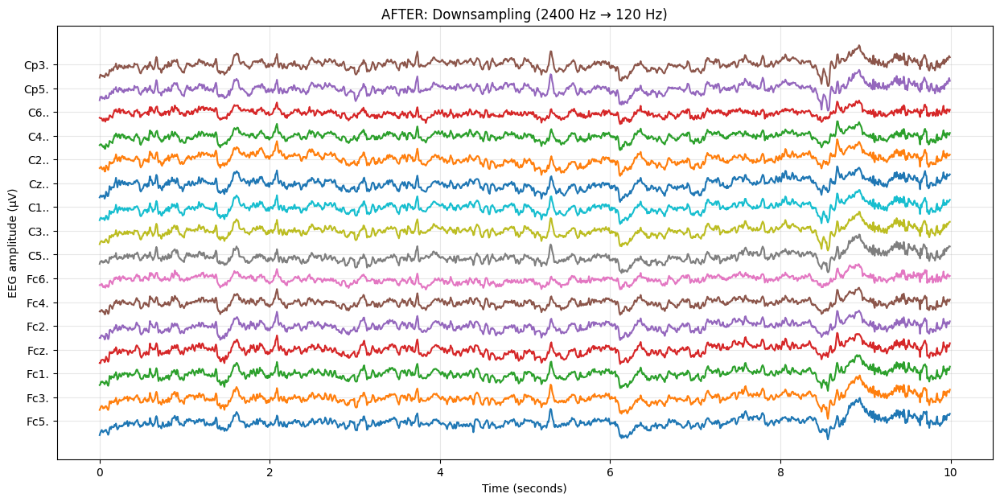

In [ ]:
# ============================================================
# CELL 9: DOWNSAMPLING
# ============================================================

# Start with the original EEG.
before = raw.copy()

print("========== BEFORE DOWNSAMPLING ==========")

print(
    "Original sampling frequency:",
    before.info["sfreq"],
    "Hz"
)

print(
    "Original number of samples:",
    before.n_times
)


# ------------------------------------------------------------
# DOWNSAMPLING
# ------------------------------------------------------------

# We want to reduce the sampling rate to 120 Hz.
target_sfreq = 120

# Make a copy so the original raw EEG is preserved.
raw_resampled = before.copy()

# Change sampling frequency.
raw_resampled.resample(
    target_sfreq,
    npad="auto",
    verbose=False
)


# ------------------------------------------------------------
# AFTER
# ------------------------------------------------------------

after = raw_resampled.copy()

print("\n========== AFTER DOWNSAMPLING ==========")

print(
    "New sampling frequency:",
    after.info["sfreq"],
    "Hz"
)

print(
    "New number of samples:",
    after.n_times
)


# ------------------------------------------------------------
# BEFORE / AFTER EEG
# ------------------------------------------------------------

plot_eeg_before_after(
    before,
    after,
    "BEFORE: Downsampling",
    "AFTER: Downsampling (2400 Hz → 120 Hz)"
)

========== BEFORE BAND-PASS FILTER ==========
Sampling frequency: 120.0 Hz

========== AFTER BAND-PASS FILTER ==========
Low frequency limit : 1 Hz
High frequency limit: 15 Hz
Band-pass filtering completed.


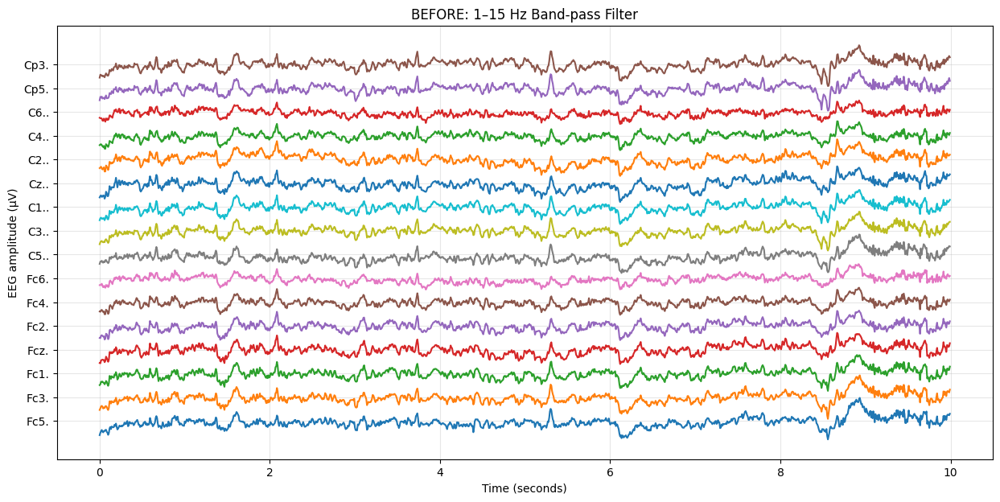

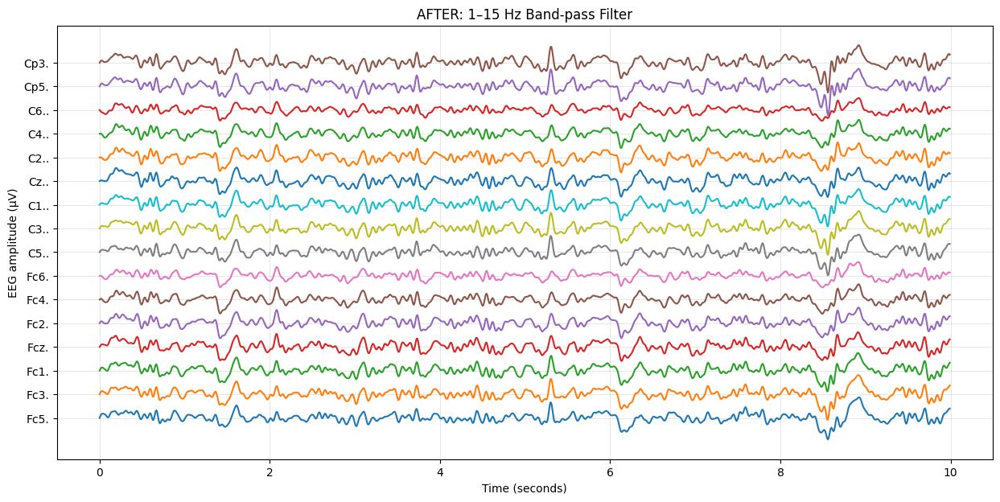

In [ ]:
# ============================================================
# CELL 10: BAND-PASS FILTER
# ============================================================

# Use the resampled EEG from Cell 9.
before = raw_resampled.copy()

print("========== BEFORE BAND-PASS FILTER ==========")

print(
    "Sampling frequency:",
    before.info["sfreq"],
    "Hz"
)


# ------------------------------------------------------------
# APPLY 1–15 Hz BAND-PASS FILTER
# ------------------------------------------------------------

# A band-pass filter keeps only the selected
# frequency range and reduces frequencies outside it.
#
# Here we keep frequencies from 1 Hz to 15 Hz.
raw_bandpass = before.copy()

raw_bandpass.filter(
    l_freq=1.0,
    h_freq=15.0,
    method="fir",
    verbose=False
)


# ------------------------------------------------------------
# AFTER
# ------------------------------------------------------------

after = raw_bandpass.copy()

print("\n========== AFTER BAND-PASS FILTER ==========")

print("Low frequency limit : 1 Hz")
print("High frequency limit: 15 Hz")
print("Band-pass filtering completed.")


# ------------------------------------------------------------
# BEFORE / AFTER
# ------------------------------------------------------------

plot_eeg_before_after(
    before,
    after,
    "BEFORE: 1–15 Hz Band-pass Filter",
    "AFTER: 1–15 Hz Band-pass Filter"
)

========== BEFORE 50 Hz NOTCH FILTER ==========
EEG before applying the notch filter.

========== AFTER 50 Hz NOTCH FILTER ==========
50 Hz notch filtering completed.


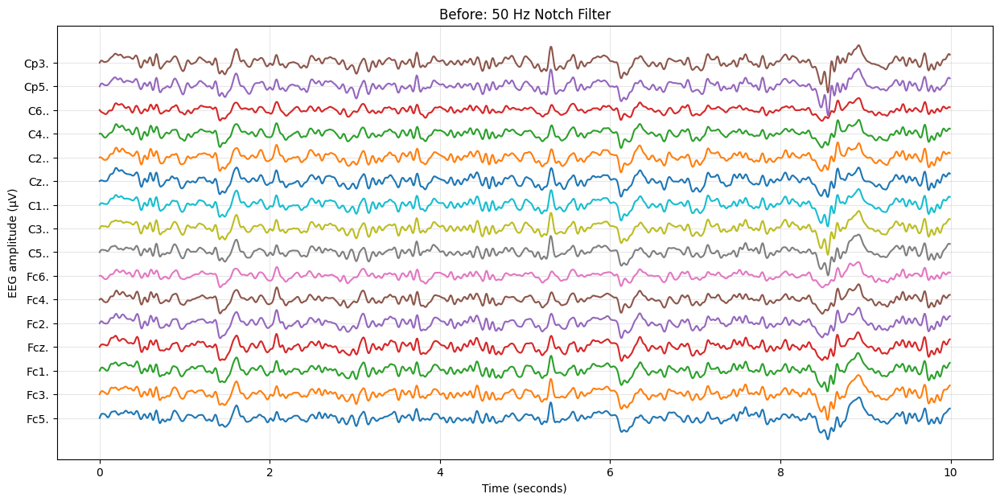

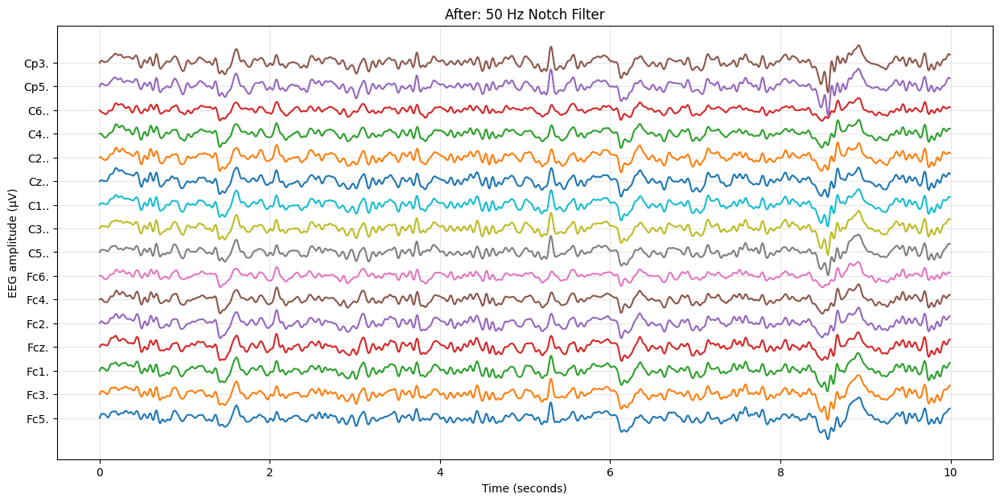

In [ ]:
# ============================================================
# CELL 11: 50 Hz NOTCH FILTER
# ============================================================

# Use the band-pass EEG from Cell 10.
before = raw_bandpass.copy()

print("========== BEFORE 50 Hz NOTCH FILTER ==========")

print(
    "EEG before applying the notch filter."
)


# ------------------------------------------------------------
# APPLY NOTCH FILTER
# ------------------------------------------------------------

# A notch filter is used to remove a specific unwanted
# frequency, commonly electrical power-line interference.
#
# Here we remove 50 Hz.
raw_notch = before.copy()

raw_notch.notch_filter(
    freqs=[50],
    method="fir",
    verbose=False
)


# ------------------------------------------------------------
# AFTER
# ------------------------------------------------------------

after = raw_notch.copy()

print("\n========== AFTER 50 Hz NOTCH FILTER ==========")

print("50 Hz notch filtering completed.")


# ------------------------------------------------------------
# BEFORE / AFTER EEG
# ------------------------------------------------------------

plot_eeg_before_after(
    before,
    after,
    "Before: 50 Hz Notch Filter",
    "After: 50 Hz Notch Filter"
)

========== BEFORE WINSORISATION ==========
Minimum value: -0.00031280981244983857
Maximum value: 0.0006844611695415166

========== AFTER WINSORISATION ==========
Minimum value: -0.00016084367582123665
Maximum value: 0.00030714694767920714
Winsorisation completed.


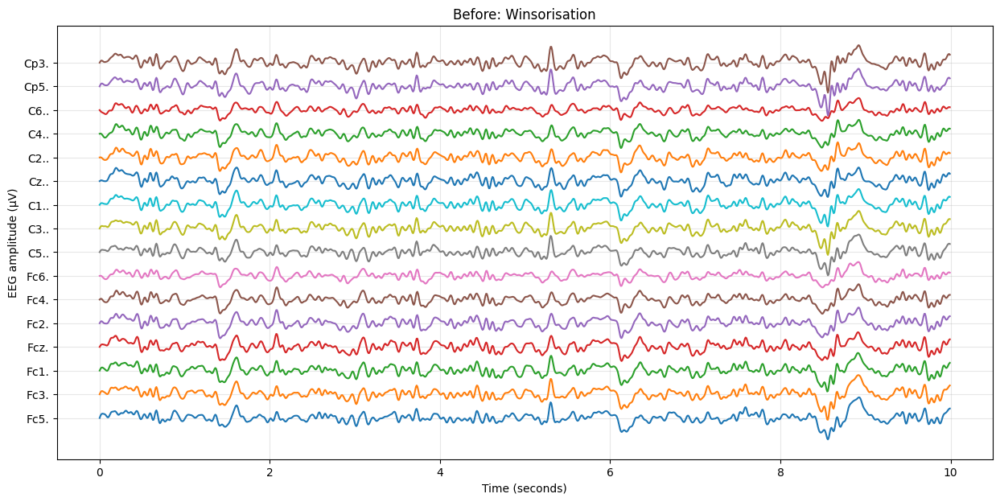

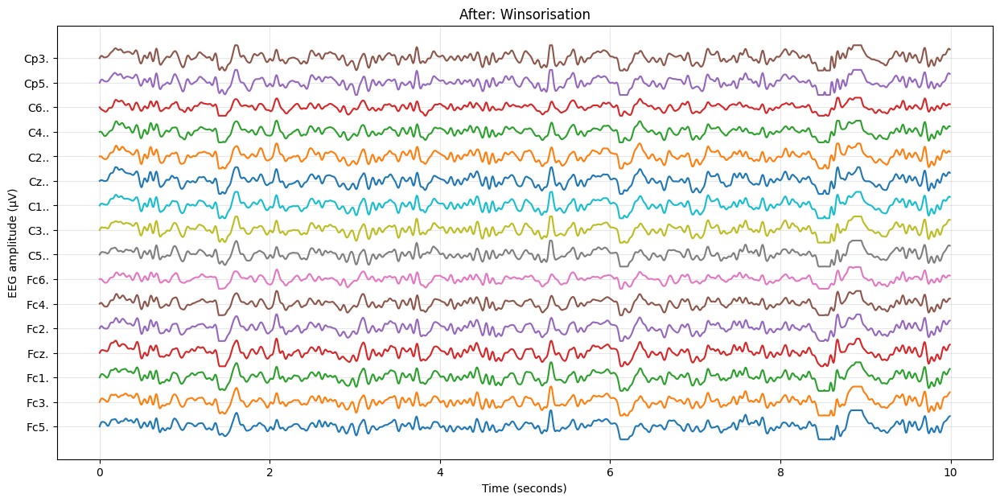

In [ ]:
# ============================================================
# CELL 12: WINSORISATION
# ============================================================

# Use the EEG after notch filtering.
before = raw_notch.copy()

print("========== BEFORE WINSORISATION ==========")

# Get EEG numerical data.
before_data = before.get_data()

print(
    "Minimum value:",
    np.min(before_data)
)

print(
    "Maximum value:",
    np.max(before_data)
)


# ------------------------------------------------------------
# WINSORISATION
# ------------------------------------------------------------

# Make a copy so the BEFORE data remains unchanged.
raw_winsor = before.copy()

data = raw_winsor.get_data()

# Find the 1st percentile for each channel.
# Values below this point are considered very extreme.
lower = np.percentile(
    data,
    1,
    axis=1,
    keepdims=True
)

# Find the 99th percentile for each channel.
# Values above this point are considered very extreme.
upper = np.percentile(
    data,
    99,
    axis=1,
    keepdims=True
)

# Clip extreme values.
# This keeps the values within the selected range.
data_winsorised = np.clip(
    data,
    lower,
    upper
)

# Put the modified data back into the MNE object.
raw_winsor._data = data_winsorised


# ------------------------------------------------------------
# AFTER
# ------------------------------------------------------------

after = raw_winsor.copy()

print("\n========== AFTER WINSORISATION ==========")

print(
    "Minimum value:",
    np.min(after.get_data())
)

print(
    "Maximum value:",
    np.max(after.get_data())
)

print("Winsorisation completed.")


# ------------------------------------------------------------
# BEFORE / AFTER EEG
# ------------------------------------------------------------

plot_eeg_before_after(
    before,
    after,
    "Before: Winsorisation",
    "After: Winsorisation"
)

========== BEFORE OUTLIER DETECTION ==========


,Channel,Outlier Samples
0,Fc5.,159
1,Fc3.,0
2,Fc1.,0
3,Fcz.,0
4,Fc2.,0
...,...,...
59,Po8.,0
60,O1..,0
61,Oz..,0
62,O2..,0


Total potential outliers: 4577

========== AFTER OUTLIER DETECTION ==========
Potential outliers have been identified.
No EEG values were changed yet.


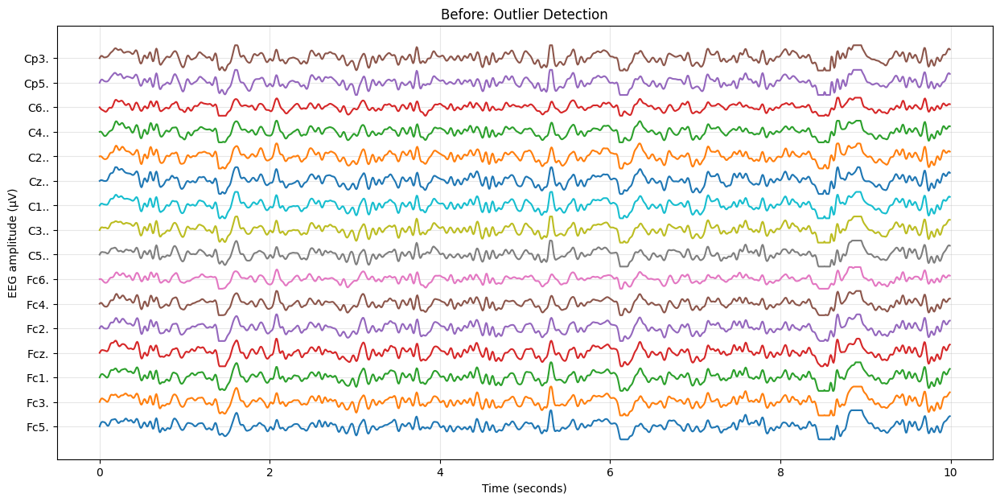

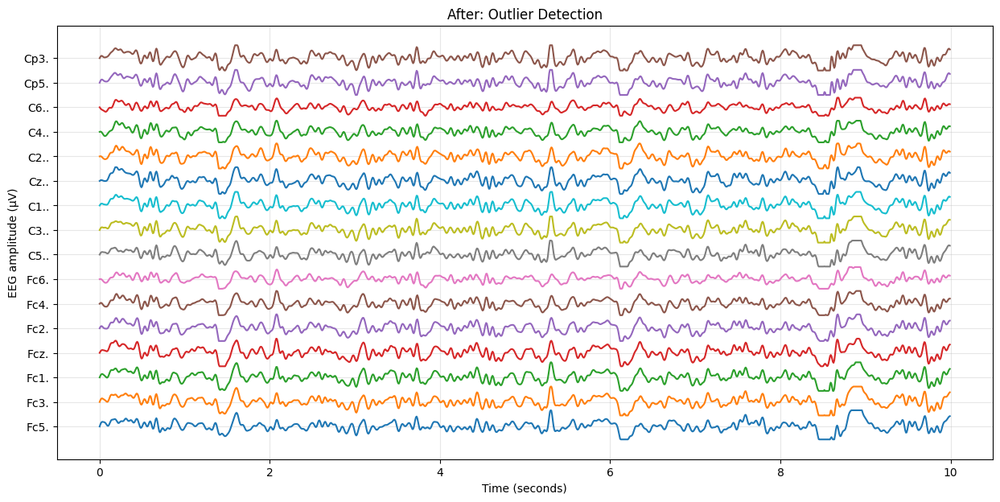

In [ ]:
# ============================================================
# CELL 13: OUTLIER DETECTION
# ============================================================

# Use the Winsorised EEG.
before = raw_winsor.copy()

print("========== BEFORE OUTLIER DETECTION ==========")

data = before.get_data()

# Calculate Z-score for every channel.
#
# Z-score tells us how far a value is
# from the average value.
z_scores = stats.zscore(
    data,
    axis=1,
    nan_policy="omit"
)

# Values with absolute Z-score > 3
# are marked as possible outliers.
outlier_mask = np.abs(z_scores) > 3

# Count outliers in every channel.
outlier_counts = np.sum(
    outlier_mask,
    axis=1
)


# Create a table to display the result.
outlier_table = pd.DataFrame({
    "Channel": before.ch_names,
    "Outlier Samples": outlier_counts
})

display(outlier_table)

print(
    "Total potential outliers:",
    int(np.sum(outlier_counts))
)


# ------------------------------------------------------------
# AFTER
# ------------------------------------------------------------

# Detection only identifies outliers.
# It does NOT change the EEG in this cell.
after = before.copy()

print("\n========== AFTER OUTLIER DETECTION ==========")

print("Potential outliers have been identified.")
print("No EEG values were changed yet.")


# ------------------------------------------------------------
# BEFORE / AFTER EEG
# ------------------------------------------------------------

plot_eeg_before_after(
    before,
    after,
    "Before: Outlier Detection",
    "After: Outlier Detection"
)

========== BEFORE OUTLIER HANDLING ==========
Potential outliers: 4577

========== AFTER OUTLIER HANDLING ==========
Outlier handling completed.


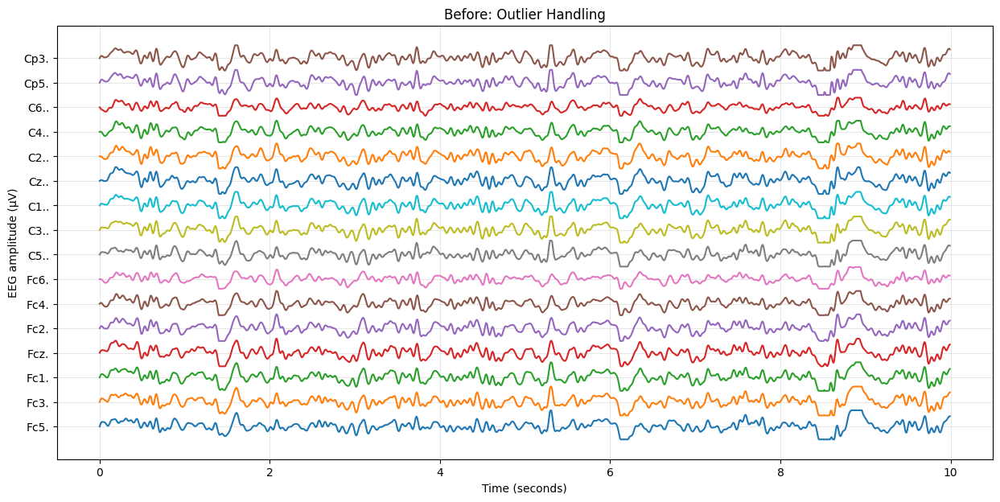

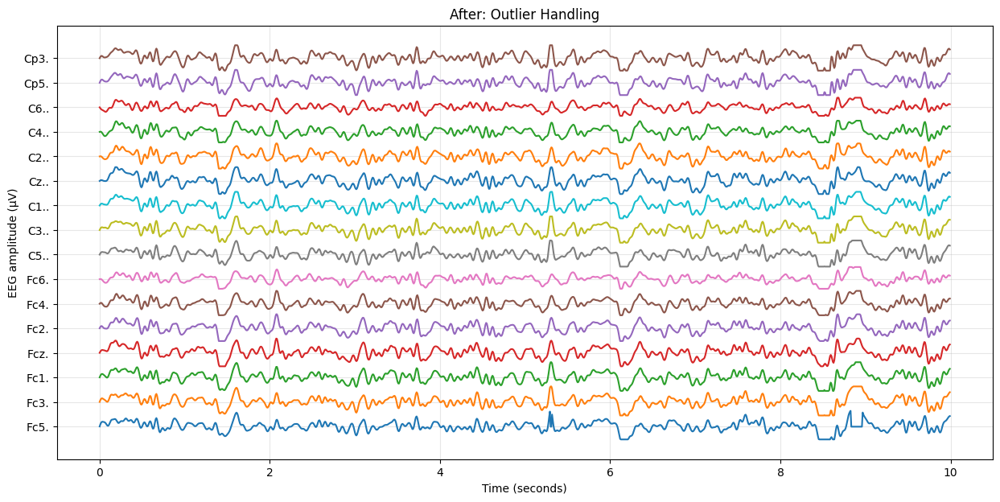

In [ ]:
# ============================================================
# CELL 14: OUTLIER HANDLING
# ============================================================

# Start with the Winsorised EEG.
before = raw_winsor.copy()

print("========== BEFORE OUTLIER HANDLING ==========")

data = before.get_data()

# Calculate Z-score.
z_scores = stats.zscore(
    data,
    axis=1,
    nan_policy="omit"
)

# Mark values whose absolute Z-score is greater than 3.
outlier_mask = np.abs(z_scores) > 3

print(
    "Potential outliers:",
    int(np.sum(outlier_mask))
)


# ------------------------------------------------------------
# HANDLE OUTLIERS
# ------------------------------------------------------------

# Create a copy for cleaning.
raw_outlier_clean = before.copy()

clean_data = raw_outlier_clean.get_data()

# Process every EEG channel separately.
for ch in range(clean_data.shape[0]):

    # Find outlier positions in this channel.
    channel_outliers = outlier_mask[ch]

    # Select normal/non-outlier values.
    valid_values = clean_data[
        ch,
        ~channel_outliers
    ]

    # Make sure there are valid values.
    if len(valid_values) > 0:

        # Calculate the median of normal values.
        channel_median = np.median(
            valid_values
        )

        # Replace extreme outlier values
        # with the channel median.
        clean_data[
            ch,
            channel_outliers
        ] = channel_median


# Save cleaned data.
raw_outlier_clean._data = clean_data


# ------------------------------------------------------------
# AFTER
# ------------------------------------------------------------

after = raw_outlier_clean.copy()

print("\n========== AFTER OUTLIER HANDLING ==========")

print("Outlier handling completed.")


# ------------------------------------------------------------
# BEFORE / AFTER EEG
# ------------------------------------------------------------

plot_eeg_before_after(
    before,
    after,
    "Before: Outlier Handling",
    "After: Outlier Handling"
)

========== BEFORE ARTIFACT DETECTION ==========
Potential artifact samples: 0

========== AFTER ARTIFACT DETECTION ==========
Potential artifacts identified.
EEG signal has not been modified yet.


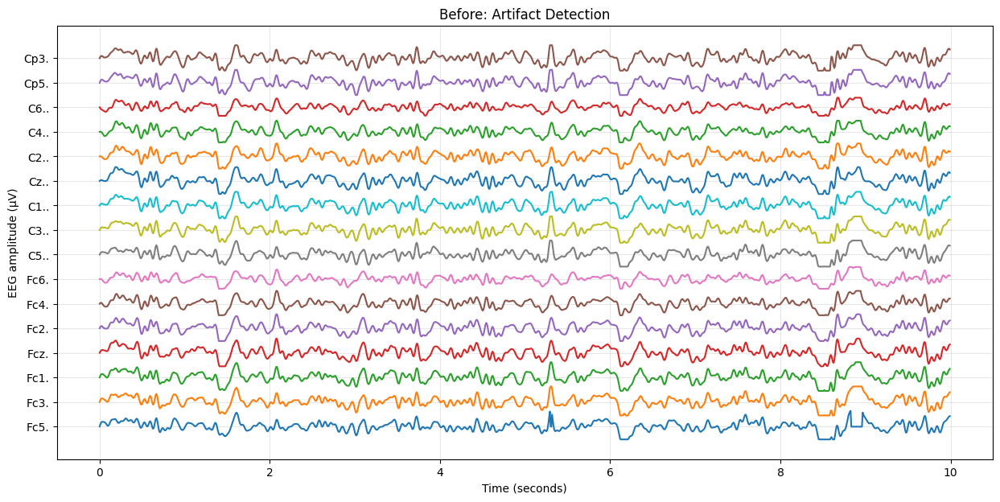

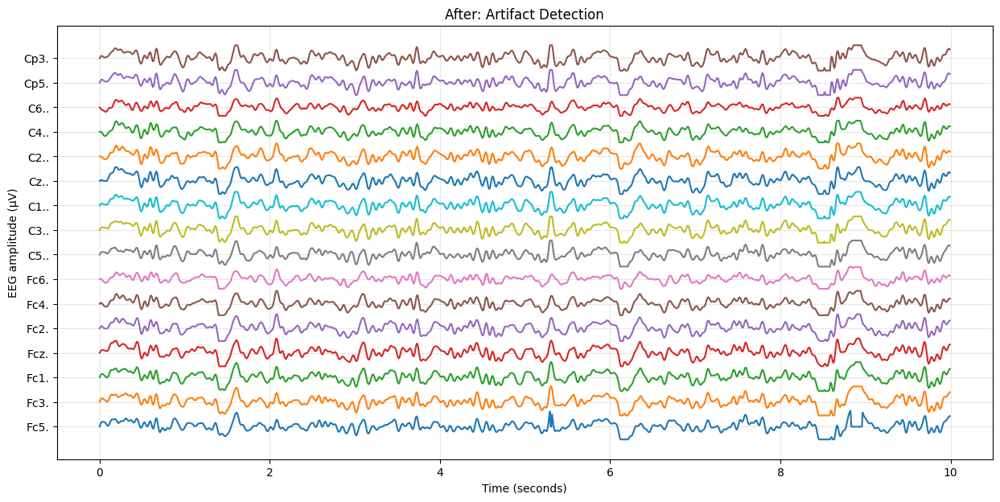

In [ ]:
# ============================================================
# CELL 15: ARTIFACT DETECTION
# ============================================================

# Use the cleaned EEG from Cell 14.
before = raw_outlier_clean.copy()

print("========== BEFORE ARTIFACT DETECTION ==========")

data = before.get_data()


# ------------------------------------------------------------
# ROBUST STATISTICS
# ------------------------------------------------------------

# Median is less affected by extreme values
# than the normal average.
median = np.median(
    data,
    axis=1,
    keepdims=True
)

# MAD means Median Absolute Deviation.
# It tells us how much the signal normally varies.
mad = np.median(
    np.abs(data - median),
    axis=1,
    keepdims=True
)

# Convert MAD into a robust estimate of standard deviation.
robust_std = 1.4826 * mad

# Avoid division/threshold problems when
# a channel has almost no variation.
robust_std[
    robust_std == 0
] = np.finfo(float).eps


# ------------------------------------------------------------
# CREATE ARTIFACT LIMITS
# ------------------------------------------------------------

# Values far away from the normal signal
# are treated as possible artifacts.
lower_limit = median - 6 * robust_std
upper_limit = median + 6 * robust_std

# Find artifact samples.
artifact_mask = (
    (data < lower_limit) |
    (data > upper_limit)
)


print(
    "Potential artifact samples:",
    int(np.sum(artifact_mask))
)


# ------------------------------------------------------------
# AFTER
# ------------------------------------------------------------

# This cell only detects artifacts.
# It does not remove them yet.
after = before.copy()

print("\n========== AFTER ARTIFACT DETECTION ==========")

print("Potential artifacts identified.")
print("EEG signal has not been modified yet.")


# ------------------------------------------------------------
# BEFORE / AFTER EEG
# ------------------------------------------------------------

plot_eeg_before_after(
    before,
    after,
    "Before: Artifact Detection",
    "After: Artifact Detection"
)

========== BEFORE ARTIFACT HANDLING ==========
Potential artifact samples: 0

========== AFTER ARTIFACT HANDLING ==========
Artifact handling completed.
Number of samples: 15000


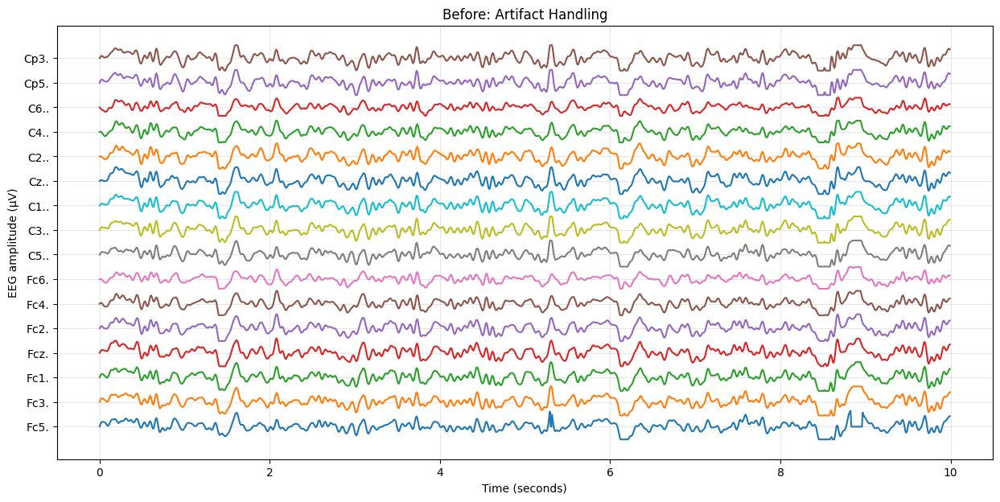

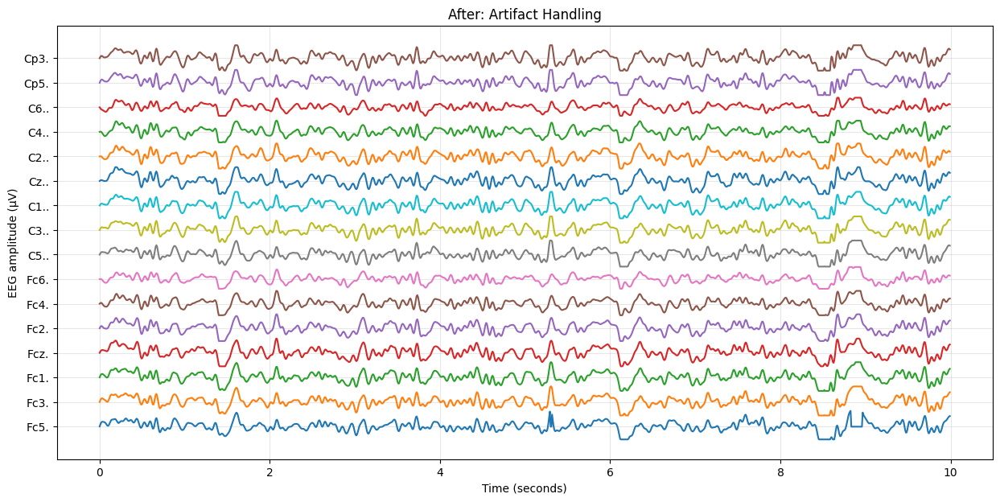

In [ ]:
# ============================================================
# CELL 16: ARTIFACT HANDLING
# ============================================================

# Use the cleaned EEG from Cell 14.
before = raw_outlier_clean.copy()

data = before.get_data()


# ------------------------------------------------------------
# DETECT EXTREME ARTIFACT VALUES AGAIN
# ------------------------------------------------------------

# Calculate channel median.
median = np.median(
    data,
    axis=1,
    keepdims=True
)

# Calculate Median Absolute Deviation.
mad = np.median(
    np.abs(data - median),
    axis=1,
    keepdims=True
)

# Estimate robust standard deviation.
robust_std = 1.4826 * mad

robust_std[
    robust_std == 0
] = np.finfo(float).eps


# Create artifact limits.
lower_limit = median - 6 * robust_std
upper_limit = median + 6 * robust_std

# Detect possible artifact samples.
artifact_mask = (
    (data < lower_limit) |
    (data > upper_limit)
)


print("========== BEFORE ARTIFACT HANDLING ==========")

print(
    "Potential artifact samples:",
    int(np.sum(artifact_mask))
)


# ------------------------------------------------------------
# HANDLE ARTIFACTS
# ------------------------------------------------------------

# Create a copy for the cleaned signal.
raw_clean = before.copy()

clean_data = raw_clean.get_data()

# Process each channel separately.
for ch in range(clean_data.shape[0]):

    # Replace detected artifact samples
    # with the channel median.
    clean_data[
        ch,
        artifact_mask[ch]
    ] = median[ch, 0]


# Store cleaned data.
raw_clean._data = clean_data


# ------------------------------------------------------------
# AFTER
# ------------------------------------------------------------

after = raw_clean.copy()

print("\n========== AFTER ARTIFACT HANDLING ==========")

print("Artifact handling completed.")

print(
    "Number of samples:",
    after.n_times
)


# ------------------------------------------------------------
# BEFORE / AFTER EEG
# ------------------------------------------------------------

plot_eeg_before_after(
    before,
    after,
    "Before: Artifact Handling",
    "After: Artifact Handling"
)

========== BEFORE BAD-CHANNEL CHECK ==========
Currently marked bad channels: []


,Channel,Standard Deviation (µV)
0,Fc5.,37.153819
1,Fc3.,40.908917
2,Fc1.,41.268570
3,Fcz.,41.151615
4,Fc2.,39.961957
...,...,...
59,Po8.,35.500413
60,O1..,39.887154
61,Oz..,38.776107
62,O2..,40.689474



========== AFTER BAD-CHANNEL CHECK ==========
Bad-channel inspection completed.
Marked bad channels: []


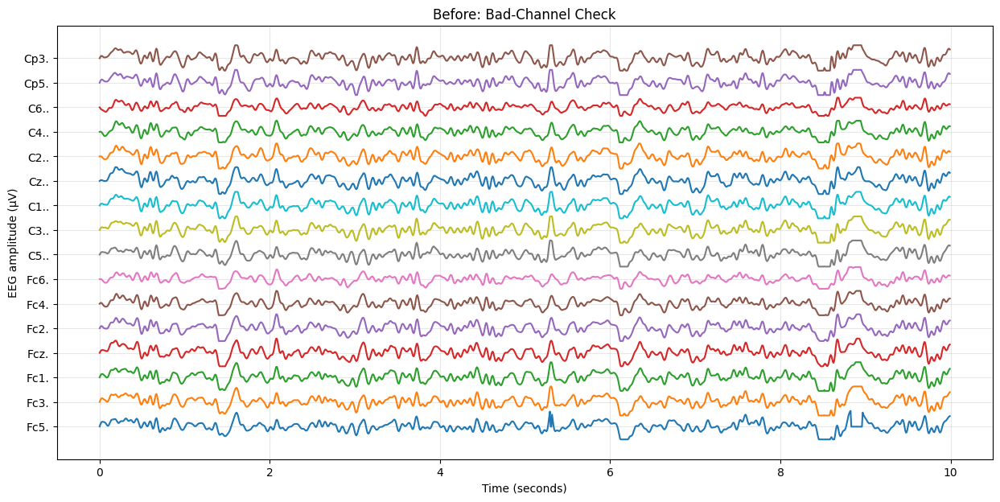

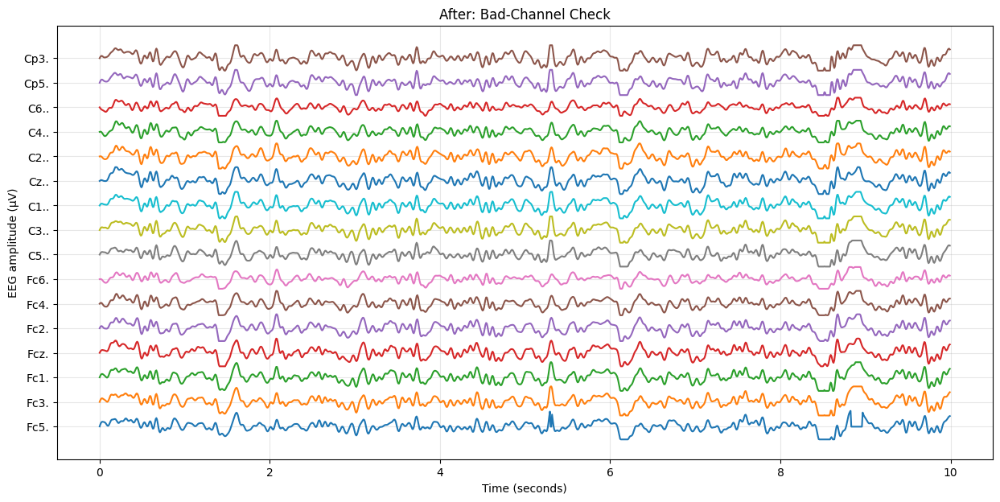

In [ ]:
# ============================================================
# CELL 17: BAD CHANNEL CHECK
# ============================================================

# Start with the cleaned EEG.
before = raw_clean.copy()

print("========== BEFORE BAD-CHANNEL CHECK ==========")

# MNE stores manually/previously marked bad channels here.
print(
    "Currently marked bad channels:",
    before.info["bads"]
)


# ------------------------------------------------------------
# CALCULATE CHANNEL VARIATION
# ------------------------------------------------------------

# Convert EEG from Volts to microvolts.
data_uv = before.get_data() * 1e6

# Calculate standard deviation for each channel.
channel_std = np.std(
    data_uv,
    axis=1
)


# Create a table.
bad_channel_table = pd.DataFrame({
    "Channel": before.ch_names,
    "Standard Deviation (µV)": channel_std
})

display(bad_channel_table)


# ------------------------------------------------------------
# AFTER
# ------------------------------------------------------------

# We do not automatically delete channels.
# A very low/high standard deviation alone is not enough
# to safely decide that a channel is bad.
after = before.copy()

print("\n========== AFTER BAD-CHANNEL CHECK ==========")

print(
    "Bad-channel inspection completed."
)

print(
    "Marked bad channels:",
    after.info["bads"]
)


# ------------------------------------------------------------
# BEFORE / AFTER EEG
# ------------------------------------------------------------

plot_eeg_before_after(
    before,
    after,
    "Before: Bad-Channel Check",
    "After: Bad-Channel Check"
)

========== BEFORE EPOCHING ==========
Continuous EEG shape: (64, 15000)
Recording duration: 124.99 seconds

========== AFTER ==========
Clean continuous EEG is ready for epoching.


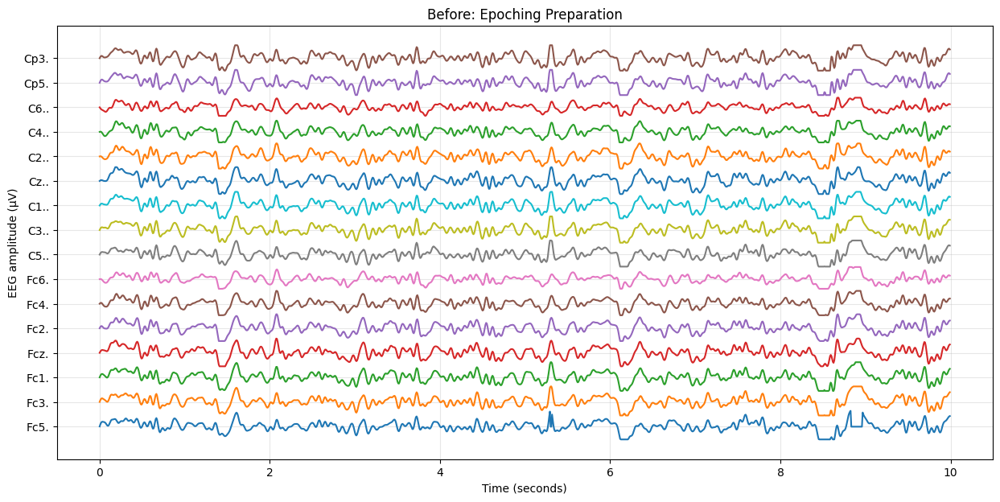

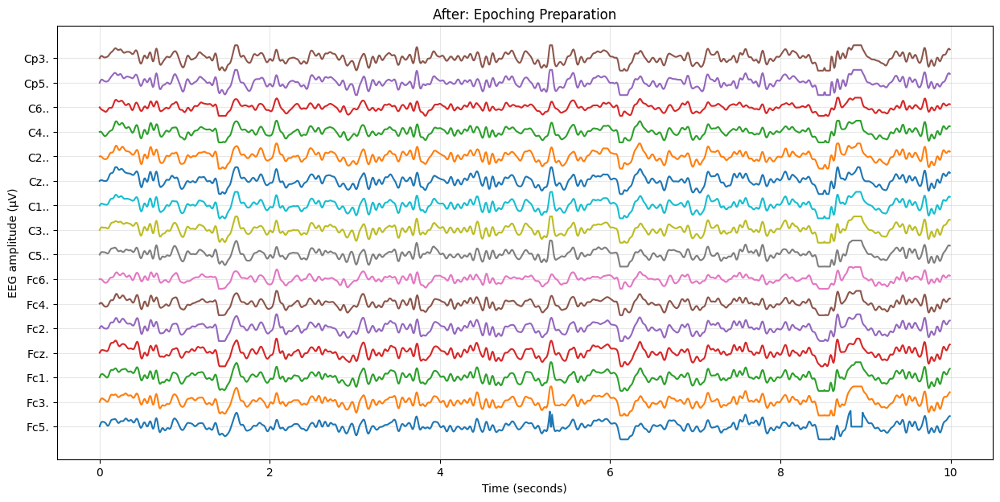

In [ ]:
# ============================================================
# CELL 18: PREPARE EEG FOR EPOCHING
# ============================================================

# Use the final cleaned continuous EEG.
before = raw_clean.copy()

print("========== BEFORE EPOCHING ==========")

print(
    "Continuous EEG shape:",
    before.get_data().shape
)

print(
    "Recording duration:",
    round(before.times[-1], 2),
    "seconds"
)


# ------------------------------------------------------------
# PREPARE
# ------------------------------------------------------------

# Make a copy for the next step.
after = before.copy()

print("\n========== AFTER ==========")

print(
    "Clean continuous EEG is ready for epoching."
)


# ------------------------------------------------------------
# BEFORE / AFTER EEG
# ------------------------------------------------------------

plot_eeg_before_after(
    before,
    after,
    "Before: Epoching Preparation",
    "After: Epoching Preparation"
)

========== BEFORE EPOCHING ==========
Continuous EEG shape: (64, 15000)

Number of events: 30
Event IDs: {'T0': 1, 'T1': 2, 'T2': 3}

Event-based epoching performed.

========== AFTER EPOCHING ==========
Number of epochs: 14
Epoch data shape: (14, 64, 85)
For automatic theme detection, "darkdetect" has to be installed! You can install it with `pip install darkdetect`


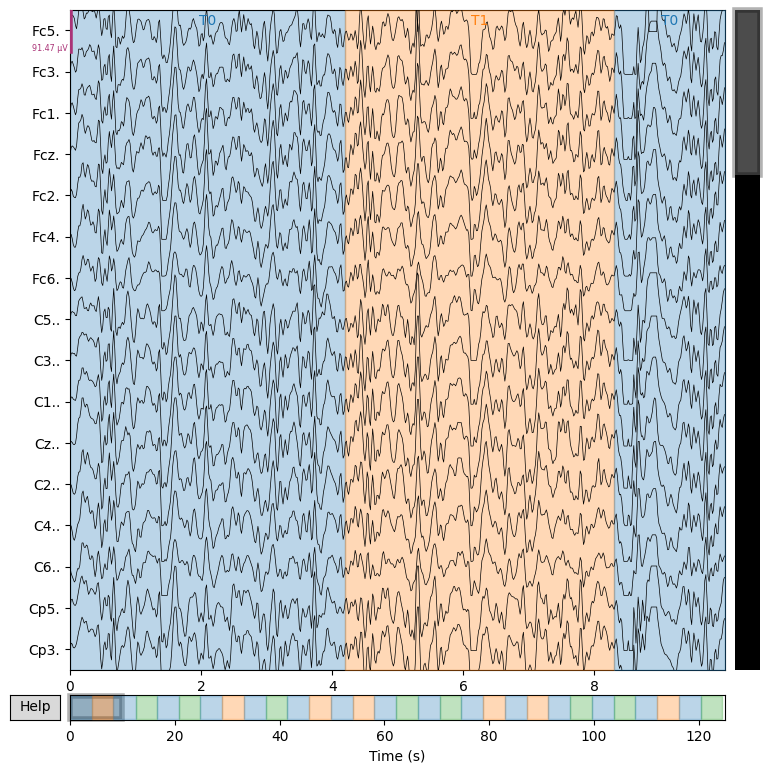

For automatic theme detection, "darkdetect" has to be installed! You can install it with `pip install darkdetect`


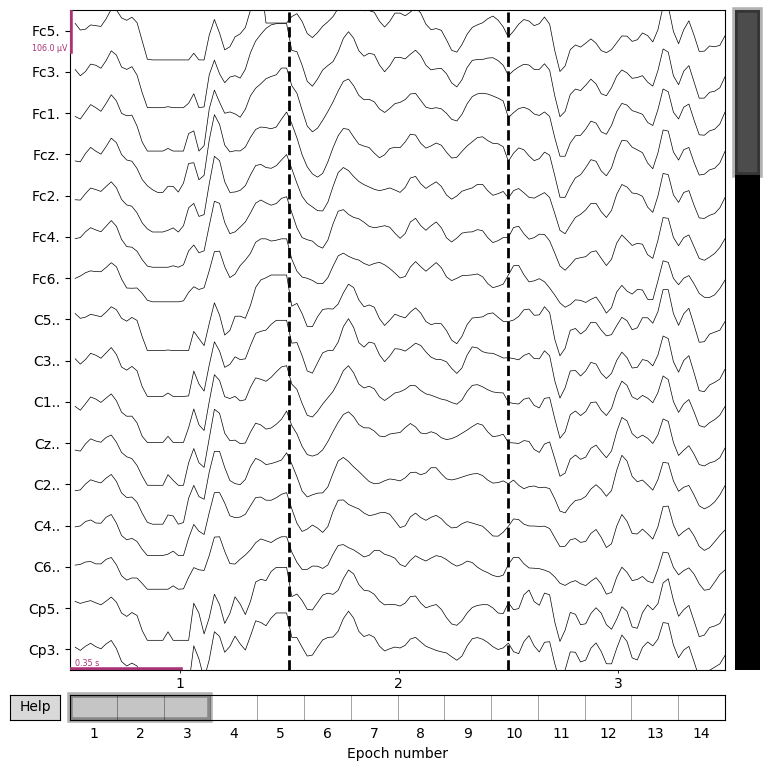

In [ ]:
# ============================================================
# CELL 19: EPOCHING
# ============================================================

# Start with clean continuous EEG.
before = raw_clean.copy()

print("========== BEFORE EPOCHING ==========")

print(
    "Continuous EEG shape:",
    before.get_data().shape
)


# ============================================================
# CHECK WHETHER EVENTS ARE AVAILABLE
# ============================================================

if len(before.annotations) > 0:

    # Convert annotations into events.
    events, event_id = mne.events_from_annotations(
        before,
        verbose=False
    )

    print(
        "\nNumber of events:",
        len(events)
    )

    print(
        "Event IDs:",
        event_id
    )


    # --------------------------------------------------------
    # SELECT FIRST EVENT TYPE
    # --------------------------------------------------------

    # For this practice dataset, select the first
    # available event type.
    first_event_name = list(
        event_id.keys()
    )[0]

    first_event_code = event_id[
        first_event_name
    ]

    # Select events belonging to this event type.
    selected_events = events[
        events[:, 2] == first_event_code
    ]


    # --------------------------------------------------------
    # CREATE EPOCHS
    # --------------------------------------------------------

    # Create small EEG segments around each event.
    #
    # tmin = -0.1 seconds before event
    # tmax =  0.6 seconds after event
    #
    # baseline = (-0.1, 0)
    # means baseline correction uses the
    # 100 ms before the event.
    epochs = mne.Epochs(
        before,
        selected_events,
        event_id={
            first_event_name:
            first_event_code
        },
        tmin=-0.1,
        tmax=0.6,
        baseline=(-0.1, 0),
        preload=True,
        reject_by_annotation=True,
        verbose=False
    )

    print(
        "\nEvent-based epoching performed."
    )

else:

    # If the practice EDF has no events,
    # we cannot perform true stimulus-based P300 epoching.
    #
    # Therefore, create fixed-length epochs only
    # so we can practice the preprocessing workflow.
    print(
        "\nNo event annotations found."
    )

    print(
        "Creating fixed-length practice epochs."
    )

    epochs = mne.make_fixed_length_epochs(
        before,
        duration=0.8,
        preload=True,
        verbose=False
    )


# ============================================================
# AFTER
# ============================================================

print("\n========== AFTER EPOCHING ==========")

print(
    "Number of epochs:",
    len(epochs)
)

print(
    "Epoch data shape:",
    epochs.get_data().shape
)


# ============================================================
# BEFORE EEG
# ============================================================

before.plot(
    duration=min(
        10,
        before.times[-1]
    ),
    n_channels=min(
        16,
        len(before.ch_names)
    ),
    scalings="auto",
    title="BEFORE: Continuous EEG",
    show=True
)

plt.show()


# ============================================================
# AFTER EEG EPOCHS
# ============================================================

# Display some epochs.
epochs.plot(
    n_epochs=min(3, len(epochs)),
    n_channels=min(
        16,
        len(before.ch_names)
    ),
    scalings="auto",
    title="AFTER: EEG Epochs",
    show=True
)

plt.show()

========== BEFORE ==========
Epoch data shape: (14, 64, 85)
Mean: 4.5285719012510425e-06
Standard deviation: 4.4738224158766735e-05


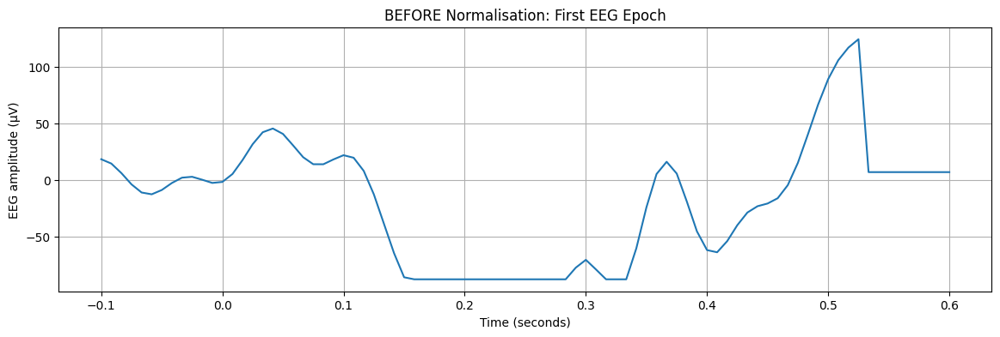


========== AFTER ==========
Epoch inspection completed.
Mean: 4.5285719012510425e-06
Standard deviation: 4.4738224158766735e-05


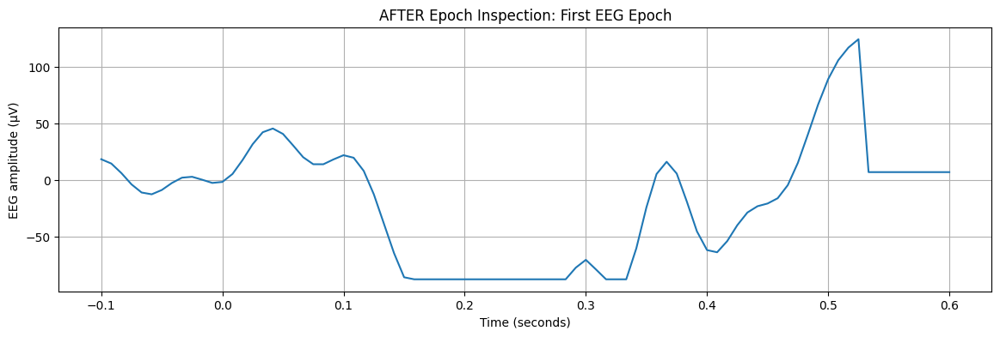

In [ ]:
# ============================================================
# CELL 20: EPOCH INSPECTION
# ============================================================

# Get the numerical epoch data.
epoch_data = epochs.get_data()

print("========== BEFORE ==========")

print(
    "Epoch data shape:",
    epoch_data.shape
)

print(
    "Mean:",
    np.mean(epoch_data)
)

print(
    "Standard deviation:",
    np.std(epoch_data)
)


# ------------------------------------------------------------
# BEFORE EEG EPOCH
# ------------------------------------------------------------

# Plot the first channel of the first epoch.
plt.figure(figsize=(14, 4))

plt.plot(
    epochs.times,
    epoch_data[0, 0, :] * 1e6
)

plt.title(
    "BEFORE Normalisation: First EEG Epoch"
)

plt.xlabel("Time (seconds)")
plt.ylabel("EEG amplitude (µV)")

plt.grid(True)
plt.show()


# ------------------------------------------------------------
# AFTER
# ------------------------------------------------------------

# This cell only inspects the data.
# Therefore no signal modification occurs.
after_epoch = epoch_data.copy()

print("\n========== AFTER ==========")

print(
    "Epoch inspection completed."
)

print(
    "Mean:",
    np.mean(after_epoch)
)

print(
    "Standard deviation:",
    np.std(after_epoch)
)


# Plot the same signal again.
plt.figure(figsize=(14, 4))

plt.plot(
    epochs.times,
    after_epoch[0, 0, :] * 1e6
)

plt.title(
    "AFTER Epoch Inspection: First EEG Epoch"
)

plt.xlabel("Time (seconds)")
plt.ylabel("EEG amplitude (µV)")

plt.grid(True)
plt.show()

========== BEFORE NORMALISATION ==========
Data shape: (14, 64, 85)
Mean: 4.5285719012510425e-06
Standard deviation: 4.4738224158766735e-05


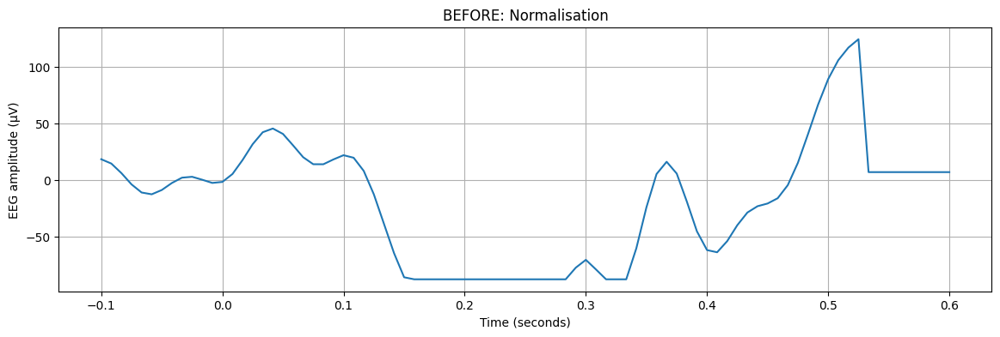


========== AFTER NORMALISATION ==========
Data shape: (14, 64, 85)
Mean: 0.0
Standard deviation: 1.0


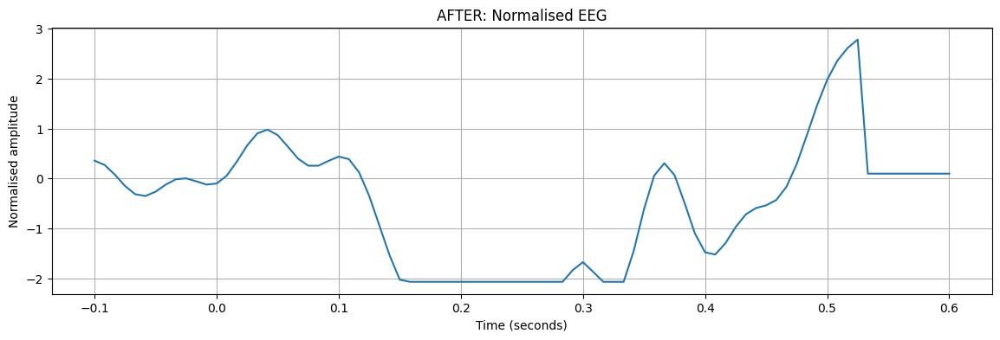

In [ ]:
# ============================================================
# CELL 21: NORMALISATION / STANDARDISATION
# ============================================================

# Get the epoch data before normalisation.
before = epochs.get_data().copy()

print("========== BEFORE NORMALISATION ==========")

print(
    "Data shape:",
    before.shape
)

print(
    "Mean:",
    np.mean(before)
)

print(
    "Standard deviation:",
    np.std(before)
)


# ============================================================
# BEFORE EEG SIGNAL
# ============================================================

# Display the first EEG channel of the first epoch.
plt.figure(figsize=(14, 4))

plt.plot(
    epochs.times,
    before[0, 0, :] * 1e6
)

plt.title(
    "BEFORE: Normalisation"
)

plt.xlabel("Time (seconds)")
plt.ylabel("EEG amplitude (µV)")

plt.grid(True)
plt.show()


# ============================================================
# NORMALISATION
# ============================================================

# Make a copy so the original epoch data is preserved.
normalised_data = before.copy()


# Process every EEG channel.
for ch in range(
    normalised_data.shape[1]
):

    # Get all epoch samples for this channel.
    channel_data = normalised_data[:, ch, :]

    # Calculate average value.
    mean_value = np.mean(
        channel_data
    )

    # Calculate standard deviation.
    std_value = np.std(
        channel_data
    )

    # Only standardise if variation exists.
    if std_value > 0:

        # Standardisation formula:
        #
        # normalized = (value - mean) / standard deviation
        normalised_data[:, ch, :] = (
            channel_data - mean_value
        ) / std_value


# ------------------------------------------------------------
# AFTER
# ------------------------------------------------------------

after = normalised_data.copy()

print("\n========== AFTER NORMALISATION ==========")

print(
    "Data shape:",
    after.shape
)

print(
    "Mean:",
    np.mean(after)
)

print(
    "Standard deviation:",
    np.std(after)
)


# ============================================================
# AFTER EEG SIGNAL
# ============================================================

plt.figure(figsize=(14, 4))

plt.plot(
    epochs.times,
    after[0, 0, :]
)

plt.title(
    "AFTER: Normalised EEG"
)

plt.xlabel("Time (seconds)")
plt.ylabel("Normalised amplitude")

plt.grid(True)
plt.show()

BEFORE: FINAL PREPROCESSING CHECK
Shape: (14, 64, 85)
Mean: 0.0
Standard deviation: 1.0

AFTER: FINAL PREPROCESSED EEG
Final EEG shape: (14, 64, 85)
Final mean: 0.0
Final standard deviation: 1.0


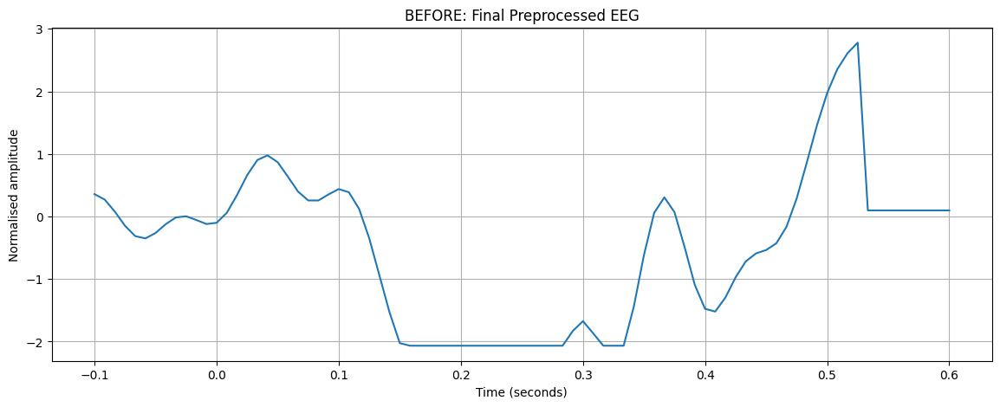

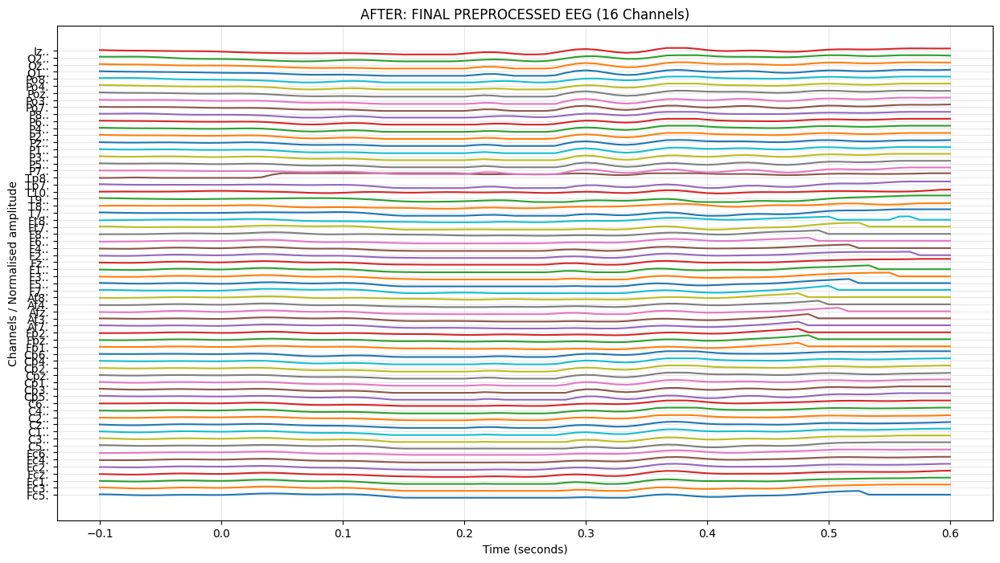


FINAL EEG PREPROCESSING COMPLETED
Final data is stored in: final_preprocessed_data


In [ ]:
# ============================================================
# CELL 22: FINAL PREPROCESSED EEG
# ============================================================

# The variable 'after' contains the normalised EEG
# produced by Cell 21.
X_preprocessed = after.copy()


# ============================================================
# BEFORE
# ============================================================

print("==============================================")
print("BEFORE: FINAL PREPROCESSING CHECK")
print("==============================================")

print(
    "Shape:",
    X_preprocessed.shape
)

print(
    "Mean:",
    np.mean(X_preprocessed)
)

print(
    "Standard deviation:",
    np.std(X_preprocessed)
)


# ============================================================
# FINAL PREPROCESSED DATA
# ============================================================

# Make a final copy.
# This is the data that can be used for the next stage
# of the project if we continue to model training later.
final_preprocessed_data = X_preprocessed.copy()


# ============================================================
# AFTER
# ============================================================

print("\n==============================================")
print("AFTER: FINAL PREPROCESSED EEG")
print("==============================================")

print(
    "Final EEG shape:",
    final_preprocessed_data.shape
)

print(
    "Final mean:",
    np.mean(final_preprocessed_data)
)

print(
    "Final standard deviation:",
    np.std(final_preprocessed_data)
)


# ============================================================
# BEFORE: FIRST EEG EPOCH
# ============================================================

plt.figure(figsize=(14, 5))

plt.plot(
    epochs.times,
    X_preprocessed[0, 0, :]
)

plt.title(
    "BEFORE: Final Preprocessed EEG"
)

plt.xlabel("Time (seconds)")
plt.ylabel("Normalised amplitude")

plt.grid(True)
plt.show()


# ============================================================
# AFTER: MULTI-CHANNEL EEG
# ============================================================

# Take the first epoch.
first_epoch = final_preprocessed_data[0]

plt.figure(figsize=(15, 8))

# Vertical spacing between channels.
offset = 5

# Plot every channel.
for ch in range(
    first_epoch.shape[0]
):

    # Shift each channel vertically
    # so that all channels can be seen clearly.
    signal = first_epoch[ch]

    plt.plot(
        epochs.times,
        signal + ch * offset
    )


plt.title(
    "AFTER: FINAL PREPROCESSED EEG "
    "(16 Channels)"
)

plt.xlabel("Time (seconds)")
plt.ylabel("Channels / Normalised amplitude")


# Display channel names.
plt.yticks(
    np.arange(
        first_epoch.shape[0]
    ) * offset,
    epochs.ch_names
)

plt.grid(True, alpha=0.3)

plt.show()


print("\n==============================================")
print("FINAL EEG PREPROCESSING COMPLETED")
print("==============================================")

print(
    "Final data is stored in: final_preprocessed_data"
)